# Log sharing - Tensorboard disabled


I proposed to use MLFlow to display the logs. I'm using dagshub.com to host the MLFlow server. I use a batch of size 20 to upload the logs, uploading one by one could delay the training loop.

The log can been seen at  https://dagshub.com/leoreigoto/Object_Detection_Vehicle_Plate.mlflow

I also added the tensorboard logs to my drive folder https://drive.google.com/drive/folders/1j1-oKIcoQC7N5lT8SDOnHBiBxDZ21q5C?usp=sharing

# Setup
Mount data from colab, install detectron 2, import modules

In [ ]:
!pip install 'git+https://github.com/facebookresearch/detectron2.git' mlflow --quiet

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 19.5/19.5 MB 30.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 4.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 8.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 15.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 51.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 195.4/195.4 kB 22.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.4/233.4 kB 13.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 147.6/147.6 kB 15.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.2/80.2 kB 10.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.7/78.7 kB 9.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 6.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━

In [ ]:
%matplotlib inline
from pathlib import Path
import cv2
from detectron2.utils.visualizer import Visualizer
from detectron2.structures import BoxMode
from detectron2.data import DatasetCatalog, MetadataCatalog
from detectron2.config import get_cfg
import random
from detectron2 import model_zoo
from detectron2.engine import DefaultTrainer, DefaultPredictor, HookBase
import matplotlib.pyplot as plt
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
import mlflow
import os
from datetime import datetime
import getpass

#Global vars
DATA_ROOT = Path('/content/Dataset/')
TRAIN_PATH ='train/Vehicle registration plate/'
TEST_PATH='validation/Vehicle registration plate/'
TRAIN_DATA_NAME = 'Vehicle_reg_plate_train'
TEST_DATA_NAME= 'Vehicle_reg_plate_test'
TRAIN_EPOCHS = 3

output_dir = 'outputs'
thing_classes = ['Reg-plate']


#set seed
def set_seed(seed):
  random.seed(seed)

# uncomment this line to fix the seed
# I'm not fixing feed to vary the MLflow logs
# set_seed(42)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!unzip -q /content/drive/MyDrive/detectron_/Dataset.zip

#Dataset load and register

In [ ]:
# write a function that loads the dataset into detectron2's standard format
def get_reg_plate_dicts(data_path: Path):
    image_files = [f.name for f in Path(data_path).glob('*.jpg')]
    dataset_dicts=[]
    for idx, filename in enumerate(image_files):
        record = {}
        image_path = data_path / filename


        height, width = cv2.imread(str(image_path)).shape[:2]

        record['file_name'] = str(image_path)
        record['image_id'] = idx
        record['height'] = height
        record['width'] = width

        image_filename = Path(filename).name
        image_name = Path(image_filename).stem
        annotation_path = data_path / 'Label' / '{}.txt'.format(image_name)
        annotation_rows = []
        bboxes=[]
        with open(annotation_path, "r") as f:
            for line in f:
                temp = line.strip().split()
                bbox = [float(temp[i]) for i in range(3, 7)]
                bboxes.append(bbox)

        objs = []
        for bbox in bboxes:
            obj= {
                'bbox': [bbox[0], bbox[1], bbox[2], bbox[3]],
                'bbox_mode': BoxMode.XYXY_ABS,
                'category_id': 0, #only one class
                'iscrowd': 0
            }

            objs.append(obj)
        record['annotations'] = objs
        dataset_dicts.append(record)
    return dataset_dicts

In [ ]:
# register train data
DatasetCatalog.register(name=TRAIN_DATA_NAME,
                        func=lambda: get_reg_plate_dicts(DATA_ROOT / TRAIN_PATH))
train_metadata = MetadataCatalog.get(TRAIN_DATA_NAME).set(thing_classes = thing_classes)

# register test data
DatasetCatalog.register(name=TEST_DATA_NAME,
                        func=lambda: get_reg_plate_dicts(DATA_ROOT / TEST_PATH))
test_metadata = MetadataCatalog.get(TEST_DATA_NAME).set(thing_classes = thing_classes)

#  <font style="color:green">1. Plot Ground Truth Bounding Boxes</font>
-

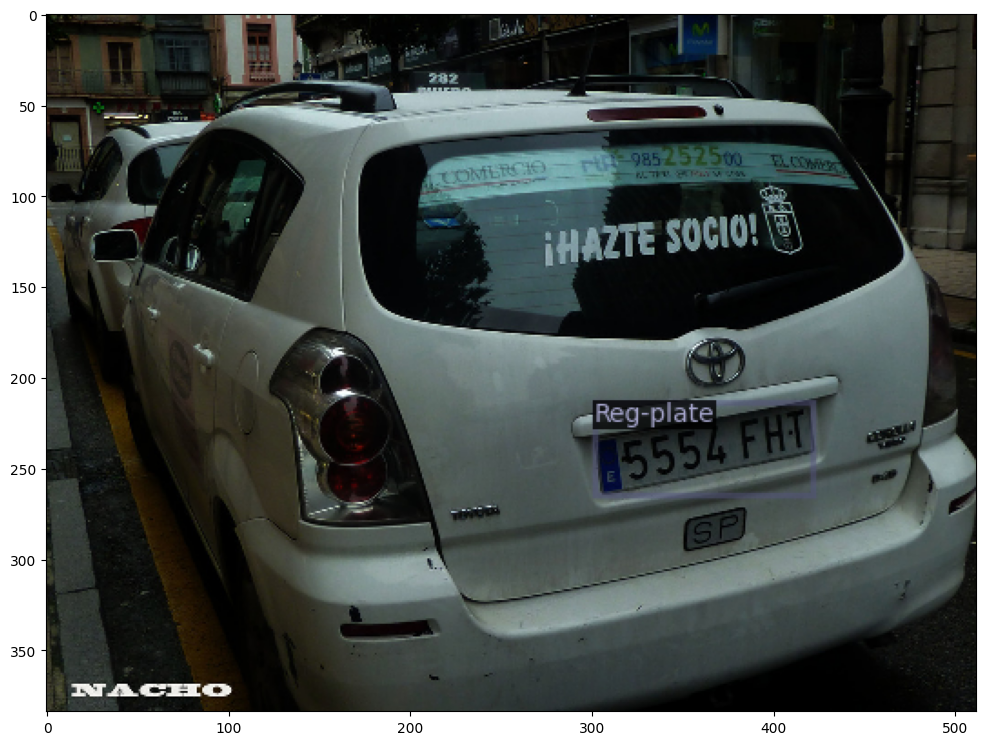

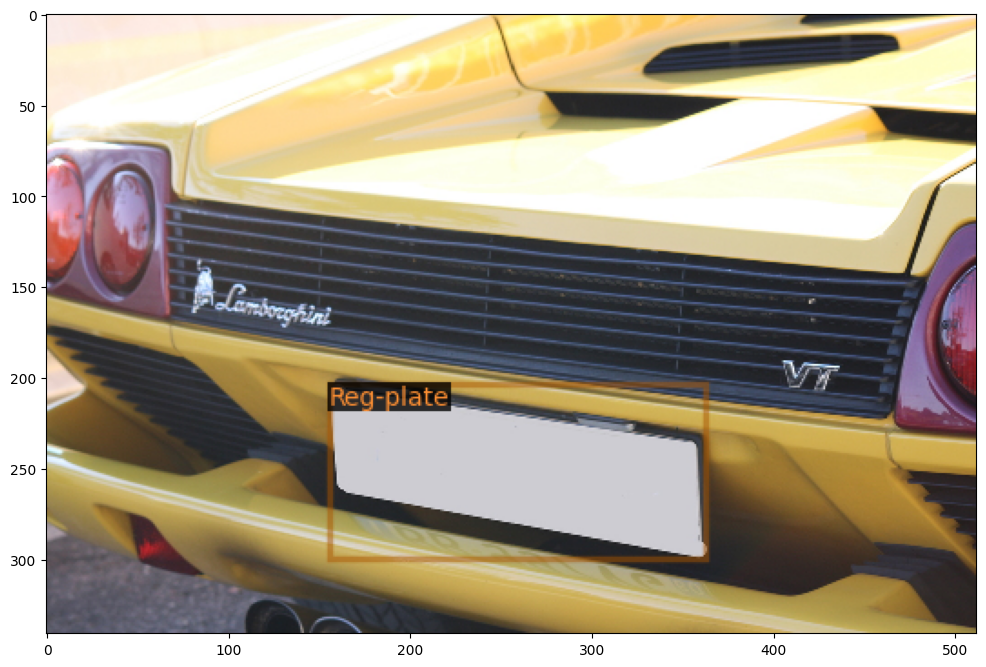

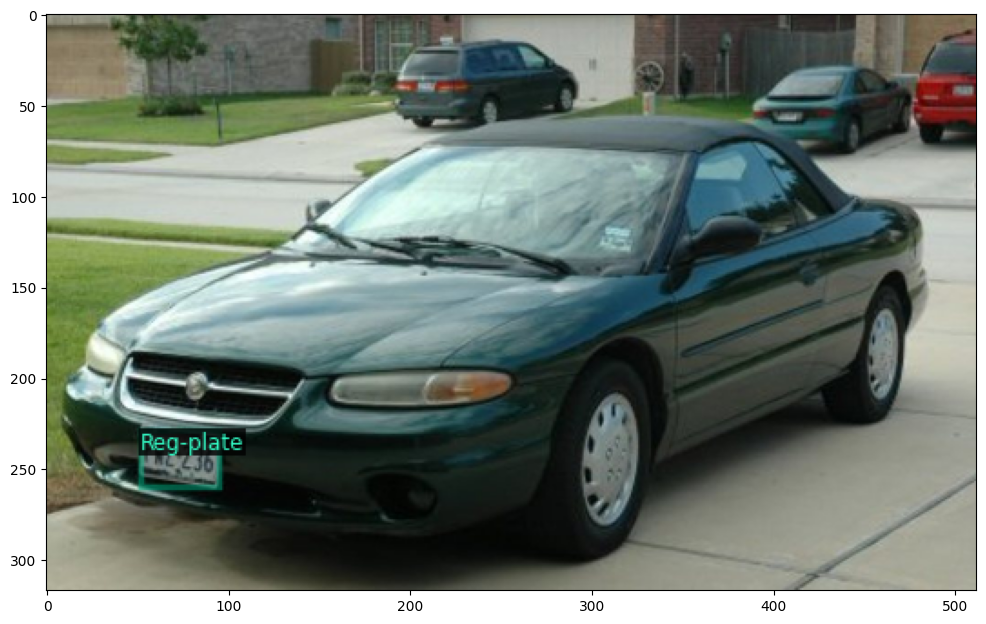

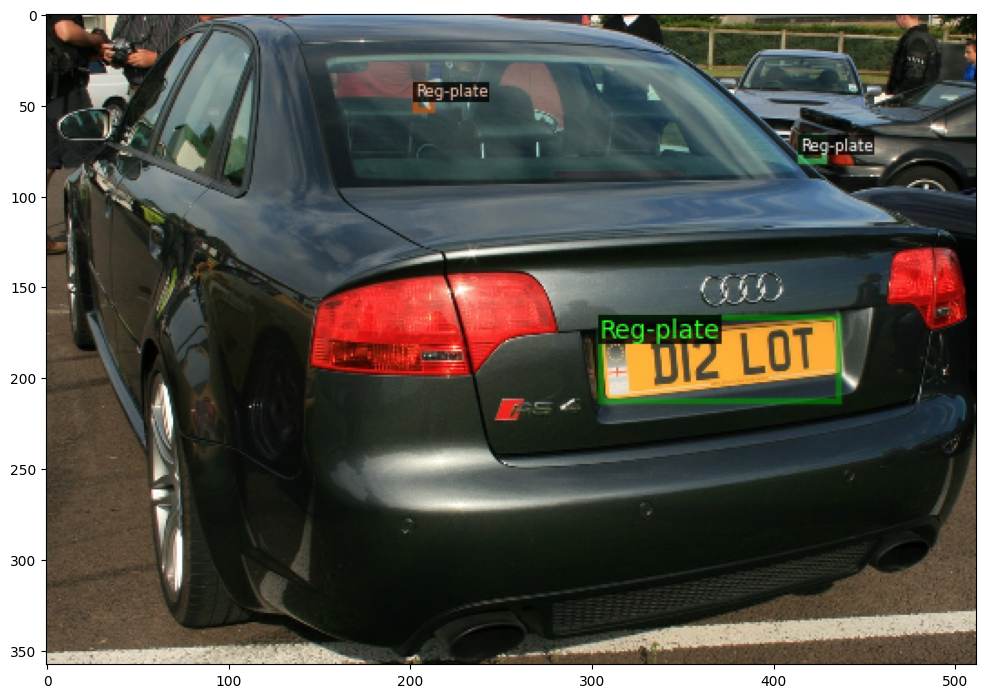

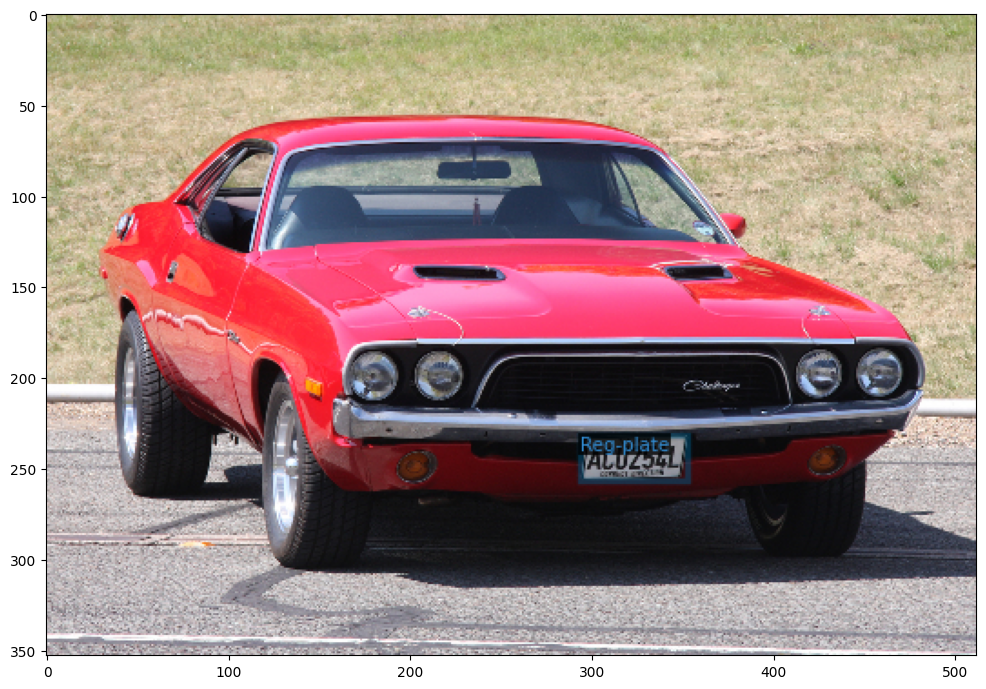

In [ ]:
test_data_dict = get_reg_plate_dicts(DATA_ROOT / TEST_PATH)

for d in random.sample(test_data_dict, 5):
    img = cv2.imread(d["file_name"])
    v = Visualizer(img[:, :, ::-1],
                            metadata=test_metadata,
                            scale=0.5)
    ground_truth = v.draw_dataset_dict(d)
    plt.figure(figsize = (12, 12))
    plt.imshow(ground_truth.get_image())
    plt.show()

#  <font style="color:green">2. Training</font>


## Load config

In [ ]:
cfg = get_cfg()
# update configuration with RetinaNet configuration
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/retinanet_R_101_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = (TRAIN_DATA_NAME,)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 4
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/retinanet_R_101_FPN_3x.yaml")
cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR = 0.001
train_img_count = len([f.name for f in (DATA_ROOT / TRAIN_PATH).glob('*.jpg')])
max_iter = int(TRAIN_EPOCHS * train_img_count / cfg.SOLVER.IMS_PER_BATCH)
cfg.SOLVER.MAX_ITER = max_iter
cfg.MODEL.RETINANET.NUM_CLASSES = len(thing_classes)
cfg.OUTPUT_DIR = output_dir
Path(cfg.OUTPUT_DIR).mkdir(parents=True, exist_ok=True)

## Tensorboard

In [ ]:
# Start tensorboard
%load_ext tensorboard
%tensorboard --logdir outputs

<IPython.core.display.Javascript object>

## MLflow config

In [ ]:
os.environ['MLFLOW_TRACKING_USERNAME'] = 'leoreigoto'
os.environ['MLFLOW_TRACKING_PROJECTNAME'] ='Object_Detection_Vehicle_Plate'
mlflow_password = getpass.getpass("Enter MLflow password: ")
os.environ['MLFLOW_TRACKING_PASSWORD'] = mlflow_password
mlflow.set_tracking_uri(f'https://dagshub.com/' + os.environ['MLFLOW_TRACKING_USERNAME'] + '/' + os.environ['MLFLOW_TRACKING_PROJECTNAME'] + '.mlflow')
mlflow.set_experiment('OD_Vehicle_Plate')
run_name=f"retinanet_R_101_FPN_3x_{datetime.now().strftime('''%Y-%m-%d_%H-%M-%S''')}"

Enter MLflow password: ··········


In [ ]:
import torch

class MLflowHook(HookBase):
  """
  A custom hook class that logs artifacts, metrics, and parameters to MLflow.
  """

  def __init__(self,batch_size=20):
    super().__init__()
    self.batch_size = batch_size
    self.buffer = []


  def after_step(self):
    with torch.no_grad():
      latest_metrics = self.trainer.storage.latest()
      for k, v in latest_metrics.items():
        self.buffer.append((k, v[0], v[1]))
        if len(self.buffer) >= self.batch_size:
          self.flush()

  def flush(self):
    if self.buffer:
      keys, values, steps = zip(*self.buffer)
      mlflow.log_metrics({k: v for k, v in zip(keys, values)}, step=max(steps))
      self.buffer.clear()

mlflow_hook = MLflowHook(batch_size=20)

## Run train

In [ ]:
# training
mlflow.pytorch.autolog()
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
with mlflow.start_run(run_name=run_name):
      mlflow.log_param("model_name", 'retinanet_R_101_FPN_3x')
      mlflow.log_param("max epochs", TRAIN_EPOCHS)
      mlflow.log_param('dataset', TRAIN_DATA_NAME)
      trainer.register_hooks(hooks=[mlflow_hook])
      trainer.train()
mlflow.end_run()

[02/23 00:13:25 d2.engine.defaults]: Model:
RetinaNet(
  (backbone): FPN(
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelP6P7(
      (p6): Conv2d(2048, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (p7): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    )
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res2)

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
model_final_971ab9.pkl: 228MB [00:01, 172MB/s]                           
head.cls_score.{bias, weight}
  pixel_mean
  pixel_std


[02/23 00:14:35 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
/usr/local/lib/python3.10/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3526.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[02/23 00:15:09 d2.utils.events]:  eta: 1:34:16  iter: 19  total_loss: 1.611  loss_cls: 1.186  loss_box_reg: 0.4973    time: 1.4235  last_time: 1.4588  data_time: 0.0587  last_data_time: 0.0211   lr: 1.9981e-05  max_mem: 5177M
[02/23 00:15:36 d2.utils.events]:  eta: 1:26:22  iter: 39  total_loss: 1.405  loss_cls: 1.033  loss_box_reg: 0.4008    time: 1.3384  last_time: 1.3297  data_time: 0.0384  last_data_time: 0.0759   lr: 3.9961e-05  max_mem: 5177M
[02/23 00:16:04 d2.utils.events]:  eta: 1:26:12  iter: 59  total_loss: 1.383  loss_cls: 0.9147  loss_box_reg: 0.4022    time: 1.3341  last_time: 1.3874  data_time: 0.0391  last_data_time: 0.0121   lr: 5.9941e-05  max_mem: 5177M
[02/23 00:16:32 d2.utils.events]:  eta: 1:25:46  iter: 79  total_loss: 0.9509  loss_cls: 0.6152  loss_box_reg: 0.3157    time: 1.3262  last_time: 1.4017  data_time: 0.0397  last_data_time: 0.0338   lr: 7.9921e-05  max_mem: 5177M
[02/23 00:16:59 d2.utils.events]:  eta: 1:25:15  iter: 99  total_loss: 0.9774  loss_cls: 

#  <font style="color:green">3. Inference</font>

[02/23 01:50:01 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from outputs/model_final.pth ...
/content/Dataset/validation/Vehicle registration plate/185d5dfa193c4ced.jpg
{'instances': Instances(num_instances=1, image_height=680, image_width=1024, fields=[pred_boxes: Boxes(tensor([[424.9230, 310.3928, 571.3027, 394.8741]], device='cuda:0')), scores: tensor([0.8263], device='cuda:0'), pred_classes: tensor([0], device='cuda:0')])}


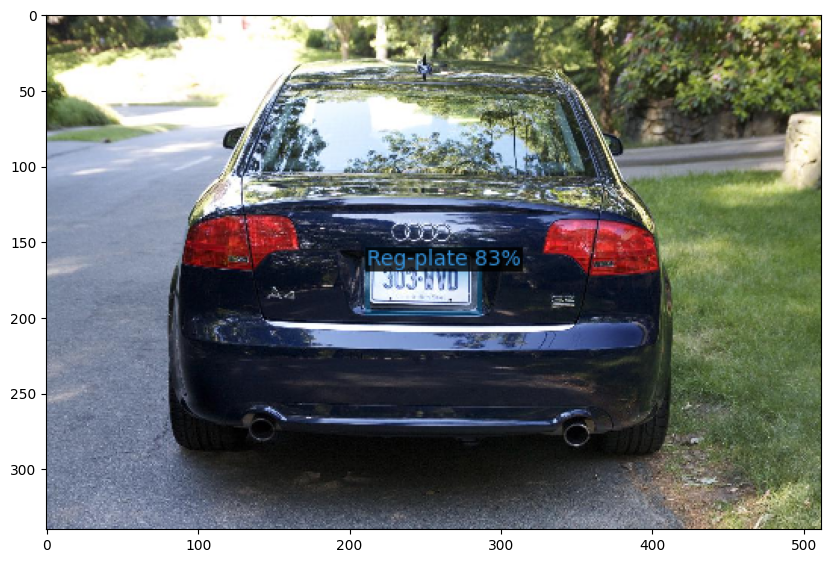

/content/Dataset/validation/Vehicle registration plate/5ff91ccfc6f15d04.jpg
{'instances': Instances(num_instances=1, image_height=715, image_width=1024, fields=[pred_boxes: Boxes(tensor([[270.1692, 266.5367, 542.2937, 351.2352]], device='cuda:0')), scores: tensor([0.8437], device='cuda:0'), pred_classes: tensor([0], device='cuda:0')])}


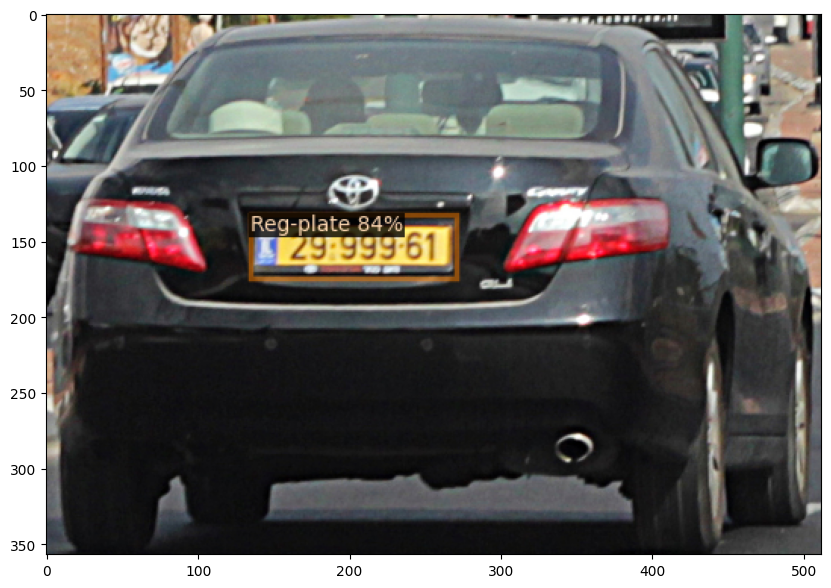

/content/Dataset/validation/Vehicle registration plate/1db3793d7c84faa1.jpg
{'instances': Instances(num_instances=1, image_height=768, image_width=1024, fields=[pred_boxes: Boxes(tensor([[167.4890, 418.5159, 213.1046, 450.3074]], device='cuda:0')), scores: tensor([0.9608], device='cuda:0'), pred_classes: tensor([0], device='cuda:0')])}


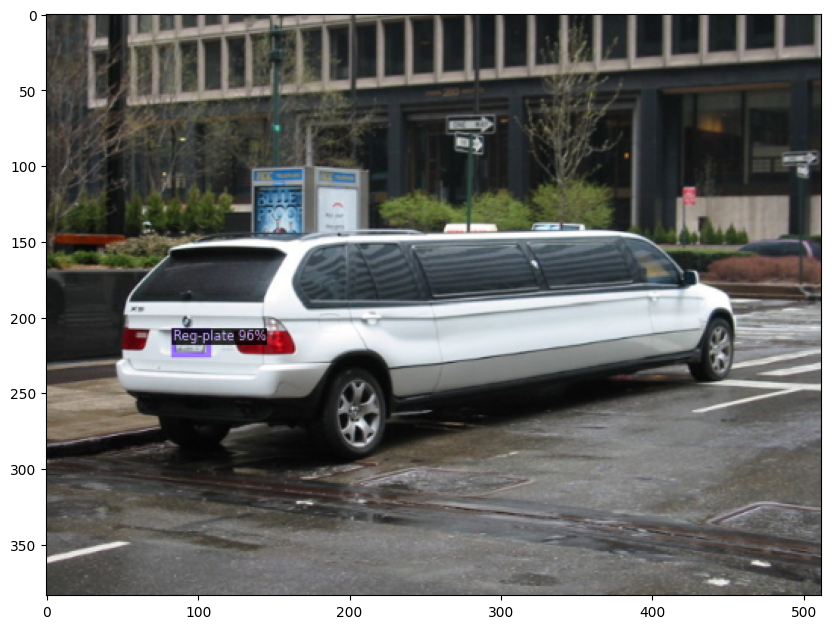

/content/Dataset/validation/Vehicle registration plate/7cbc7ee444622a66.jpg
{'instances': Instances(num_instances=1, image_height=1024, image_width=1024, fields=[pred_boxes: Boxes(tensor([[494.1840, 614.0176, 729.6304, 687.7048]], device='cuda:0')), scores: tensor([0.8991], device='cuda:0'), pred_classes: tensor([0], device='cuda:0')])}


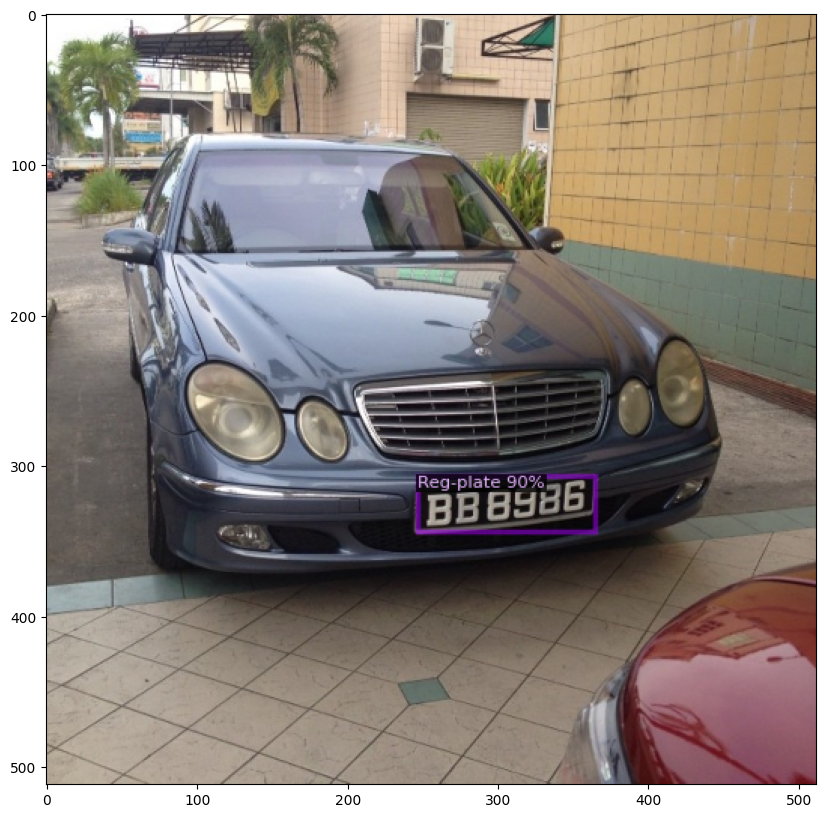

/content/Dataset/validation/Vehicle registration plate/1545c73bdecb3e2f.jpg
{'instances': Instances(num_instances=1, image_height=523, image_width=1024, fields=[pred_boxes: Boxes(tensor([[101.2672, 329.5159, 195.7029, 374.0165]], device='cuda:0')), scores: tensor([0.9332], device='cuda:0'), pred_classes: tensor([0], device='cuda:0')])}


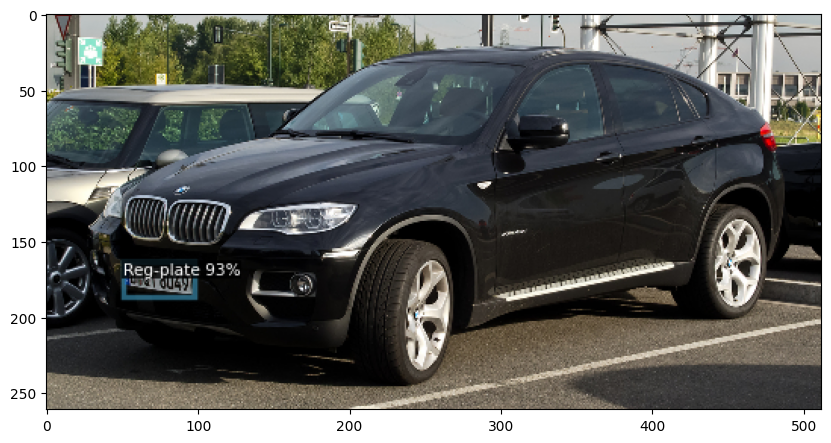

In [ ]:
cfg.MODEL.WEIGHTS = str(Path(cfg.OUTPUT_DIR) / "model_final.pth")
cfg.MODEL.RETINANET.SCORE_THRESH_TEST = 0.5
cfg.DATASETS.TEST = (TEST_DATA_NAME,)
predictor = DefaultPredictor(cfg)

for sample in random.sample(test_data_dict,5):
  print(sample["file_name"])
  img = cv2.imread(sample["file_name"])
  output = predictor(img)
  print(output)
  v = Visualizer(img[:, :, ::-1],
                            metadata=test_metadata,
                            scale=0.5)
  pred_img = v.draw_instance_predictions(output["instances"].to("cpu"))
  plt.figure(figsize = (10, 10))
  plt.imshow(pred_img.get_image())
  plt.show()



#  <font style="color:green">4. COCO Detection Evaluation [25 Points]</font>

For  reference here is the coco evaluation metric chart:


---

<img src="https://www.learnopencv.com/wp-content/uploads/2020/03/c3-w9-coco_metric.png">

---

#### <font style="color:red">The expected `AP` (primary challenge metric) is more than `0.5`.</font>

**The expected output should look similar to the following:**

```
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.550
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.886
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.629
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.256
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.653
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.627
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.504
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.629
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.633
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.380
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.722
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.704
```



In [ ]:
eval_dir = Path(cfg.OUTPUT_DIR) / 'coco_eval'
eval_dir.mkdir(parents=True, exist_ok=True)

evaluator = COCOEvaluator(dataset_name=TEST_DATA_NAME,
                          tasks=cfg,
                          distributed=False,
                          output_dir=eval_dir)

val_loader = build_detection_test_loader(cfg, TEST_DATA_NAME)

inference_on_dataset(trainer.model, val_loader, evaluator)

WARNING [02/23 01:50:06 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
[02/23 01:50:06 d2.evaluation.coco_evaluation]: Trying to convert 'Vehicle_reg_plate_test' to COCO format ...
[02/23 01:50:06 d2.data.datasets.coco]: Converting annotations of dataset 'Vehicle_reg_plate_test' to COCO format ...)
[02/23 01:50:12 d2.data.datasets.coco]: Converting dataset dicts into COCO format
[02/23 01:50:12 d2.data.datasets.coco]: Conversion finished, #images: 386, #annotations: 512
[02/23 01:50:12 d2.data.datasets.coco]: Caching COCO format annotations at 'outputs/coco_eval/Vehicle_reg_plate_test_coco_format.json' ...
[02/23 01:50:17 d2.data.build]: Distribution of instances among all 1 categories:
|  category  | #instances   |
|:----------:|:-------------|
| Reg-plate  | 512          |
|            |              |
[02/23 01:50:17 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in infere

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


[02/23 01:50:20 d2.evaluation.evaluator]: Inference done 11/386. Dataloading: 0.0036 s/iter. Inference: 0.2227 s/iter. Eval: 0.0004 s/iter. Total: 0.2267 s/iter. ETA=0:01:25
[02/23 01:50:25 d2.evaluation.evaluator]: Inference done 41/386. Dataloading: 0.0030 s/iter. Inference: 0.1739 s/iter. Eval: 0.0003 s/iter. Total: 0.1774 s/iter. ETA=0:01:01
[02/23 01:50:30 d2.evaluation.evaluator]: Inference done 76/386. Dataloading: 0.0025 s/iter. Inference: 0.1592 s/iter. Eval: 0.0003 s/iter. Total: 0.1621 s/iter. ETA=0:00:50
[02/23 01:50:35 d2.evaluation.evaluator]: Inference done 101/386. Dataloading: 0.0031 s/iter. Inference: 0.1691 s/iter. Eval: 0.0003 s/iter. Total: 0.1726 s/iter. ETA=0:00:49
[02/23 01:50:40 d2.evaluation.evaluator]: Inference done 134/386. Dataloading: 0.0027 s/iter. Inference: 0.1645 s/iter. Eval: 0.0003 s/iter. Total: 0.1677 s/iter. ETA=0:00:42
[02/23 01:50:45 d2.evaluation.evaluator]: Inference done 166/386. Dataloading: 0.0027 s/iter. Inference: 0.1643 s/iter. Eval: 0.

OrderedDict([('bbox',
              {'AP': 59.57379277268571,
               'AP50': 89.54463997677847,
               'AP75': 69.94067427059986,
               'APs': 30.75130532890413,
               'APm': 68.3759515091881,
               'APl': 66.76621018776797})])

# <font style="color:green">5. Run Inference on a Video</font>


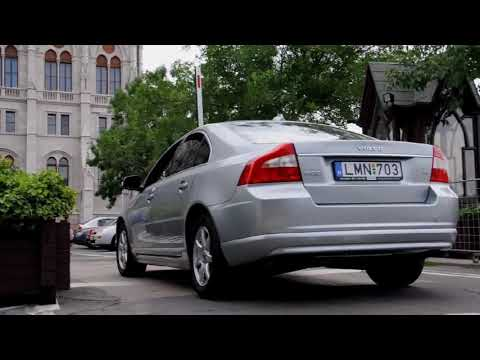

In [ ]:
from IPython.display import YouTubeVideo, display
video = YouTubeVideo("18HWHCevFdU", width=640, height=360)
display(video)

## Read and write a video

In [ ]:
def video_read_write(video_path,output_fname,predictor,metadata):
    """
    Read video frames one-by-one, flip it, and write in the other video.
    video_path (str): path/to/video
    output_fname (str): path/to/output_video
    predictor (object): detectron2 predictor object
    metadata (dict): detectron2 metadata
    """
    video = cv2.VideoCapture(video_path)

    # Check if camera opened successfully
    if not video.isOpened():
        print("Error opening video file")
        return

    # create video writer
    width = int(video.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(video.get(cv2.CAP_PROP_FRAME_HEIGHT))
    frames_per_second = video.get(cv2.CAP_PROP_FPS)
    num_frames = int(video.get(cv2.CAP_PROP_FRAME_COUNT))

    output_file = cv2.VideoWriter(
        filename=output_fname,
        fourcc=cv2.VideoWriter_fourcc(*"XVID"),
        fps=float(frames_per_second),
        frameSize=(width, height),
        isColor=True,
    )

    i = 0
    while video.isOpened():
        ret, frame = video.read()
        if ret:
            output = predictor(frame)
            v = Visualizer(frame[:, :, ::-1],
                            metadata=metadata,
                            scale=1)
            pframe = v.draw_instance_predictions(output["instances"].to("cpu"))
            output_file.write(pframe.get_image()[:,:,::-1])
            i += 1
        else:
            break
    video.release()
    output_file.release()

    return

In [ ]:
video_read_write('/content/drive/MyDrive/detectron_/projet3-input-video.mp4','/content/output_video_.mp4',predictor,train_metadata)

In [ ]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"

!zip -r /content/outputs_.zip /content/outputs

from google.colab import files
#files.download("/content/outputs.zip")
files.download("/content/output_video_.mp4")

  adding: content/outputs/ (stored 0%)
  adding: content/outputs/model_final.pth (deflated 7%)
  adding: content/outputs/coco_eval/ (stored 0%)
  adding: content/outputs/coco_eval/instances_predictions.pth (deflated 60%)
  adding: content/outputs/coco_eval/Vehicle_reg_plate_test_coco_format.json (deflated 81%)
  adding: content/outputs/coco_eval/Vehicle_reg_plate_test_coco_format.json.lock (stored 0%)
  adding: content/outputs/coco_eval/coco_instances_results.json (deflated 72%)
  adding: content/outputs/metrics.json (deflated 75%)
  adding: content/outputs/events.out.tfevents.1708647309.63b01608300f.577.0 (deflated 69%)
  adding: content/outputs/last_checkpoint (stored 0%)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
!cp "/content/output_video_.mp4"  "/content/drive/MyDrive/detectron_/output_video_.mp4"
!cp "/content/outputs_.zip" "/content/drive/MyDrive/detectron_/outputs_.zip"

!mkdir -p /content/outputs_without_model  # Create the destination folder if it doesn't exist
!cp -r /content/outputs/. /content/outputs_without_model/  # Copy all files and subfolders
!rm /content/outputs_without_model/model_final.pth
!zip -r /content/outputs_without_model.zip /content/outputs_without_model
!cp "/content/outputs_without_model.zip" "/content/drive/MyDrive/detectron_/outputs_without_model.zip"

  adding: content/outputs_without_model/ (stored 0%)
  adding: content/outputs_without_model/coco_eval/ (stored 0%)
  adding: content/outputs_without_model/coco_eval/instances_predictions.pth (deflated 60%)
  adding: content/outputs_without_model/coco_eval/Vehicle_reg_plate_test_coco_format.json (deflated 81%)
  adding: content/outputs_without_model/coco_eval/Vehicle_reg_plate_test_coco_format.json.lock (stored 0%)
  adding: content/outputs_without_model/coco_eval/coco_instances_results.json (deflated 72%)
  adding: content/outputs_without_model/metrics.json (deflated 75%)
  adding: content/outputs_without_model/events.out.tfevents.1708647309.63b01608300f.577.0 (deflated 69%)
  adding: content/outputs_without_model/last_checkpoint (stored 0%)


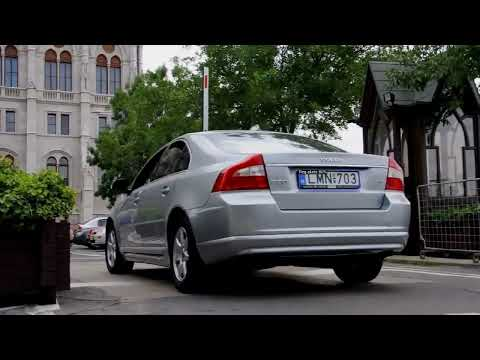

In [1]:
from IPython.display import YouTubeVideo, display
video = YouTubeVideo("2uCMVJ7B49E", width=640, height=360)
display(video)